# Analyse the Extracted Samples

In [1]:
# import necessary modules

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import os
import glob
import pickle
import warnings
import tqdm
import pandas as pd
# import librosa
# import librosa.display as display
import biosppy
from scipy import signal
from scipy.stats import zscore
from scipy.io import wavfile
from scipy.fft import fft,fftfreq
from scipy.fftpack import fft

warnings.filterwarnings("ignore")

%matplotlib inline
import matplotlib as mlp
mlp.rc("xtick",labelsize=10)
mlp.rc("ytick",labelsize=10)
mlp.rc("axes",labelsize=11)
plt.rcParams["figure.figsize"] = [11,5]
plt.rcParams["figure.dpi"] = 300

CURR_DIR = os.getcwd()

In [2]:
# make necessary definitions

# directories definitions
MAIN_DIR = "."
if os.path.basename(os.getcwd())!="Silent-Interface-for-IOT-Devices":
    os.chdir("..")

DATA_DIR = os.path.join(MAIN_DIR,"new_dataset")
FIG_DIR = os.path.join(MAIN_DIR,"figures")
PICKLE_DIR = os.path.join(MAIN_DIR,"pickles")
os.makedirs(FIG_DIR,exist_ok=True)
os.makedirs(PICKLE_DIR,exist_ok=True)

# hardware definitions
"""
https://docs.openbci.com/docs/02Cyton/CytonDataFormat#:~:text=By%20default%2C%20our%20Arduino%20sketch,of%200.02235%20microVolts%20per%20count
"""
SAMPLING_RATE = 250 #Hz
NUM_CHANNELS = 8 
ADC_RESOLUTION = 24 #bits
ADC_GAIN = 24.0
REF_VOLTAGE = 4.5 #Volts
SCALE_FACTOR = (REF_VOLTAGE/float((pow(2,23))-1)/ADC_GAIN)*1000000.0 #micro-volts

# dataset definitions
SPEAKER = ["RL","RN","SR","US"]
SESSION = ["Session 1","Session 2","Session 3"]
# MODE = mentally
SENTENCES =["अबको समय सुनाउ","एउटा सङ्गित बजाउ","आजको मौसम बताउ","बत्तिको अवस्था बदल","पङ्खाको स्तिथी बदल"]

SENTENCE_LABEL= np.array(SENTENCES)[[3, 2, 1, 4, 0, 3, 2, 1, 4, 0, 3, 2, 1, 4, 0]]

# a function to save plotted figures
def save_fig(fig_id, tight_layout=True, fig_extension="png", resolution=300):
    path = os.path.join(FIG_DIR, fig_id + "." + fig_extension)
    print("Saving figure", fig_id)
    if tight_layout:
        plt.tight_layout()
    plt.savefig(path, format=fig_extension, dpi=resolution)
# print(DATA_DIR)

In [3]:
all_files = glob.glob(DATA_DIR+"/*/*/*.txt",recursive=True)
print(len(all_files))     #no. of .txt files in new_dataset

115


In [4]:
def parser(files,FILTER=True,):
    """
    parser function to extract utterances from .txt file and store them in a dictionary
    """
    
    dataset = {"data":[], "speaker":[], "labels":[], "session":[], "filename":[]}
    def get_data(file):
        session = file.split("/")[-2]
        speaker = file.split("/")[-3]
        filename = file.split("/")[-1]
        signal = read_data(file)
#         print(signal)
        
        # only take files with 15 labels         
        if (len(signal)!=len(SENTENCE_LABEL) and FILTER):
            return
        
        dataset["data"].extend(signal)
        dataset["speaker"].extend([speaker]*len(signal))
        dataset["session"].extend([session]*len(signal))
        dataset["labels"].extend(SENTENCE_LABEL)
        dataset["filename"].extend([filename]*len(signal))

    def read_data(file):
        f = open(file, 'r')
        contents = map(lambda x: x.strip(), f.readlines())
        #the file starts with '%' and some instruction before data and removing these data 
        frames_original = list(filter(lambda x : x and x[0] != '%', contents))[1:]
        #the data row contains channe*len(signal)*len(signal)ls info digital trigger and accelerometer info separated by comma
        frames_original = list(map(lambda s : list(map(lambda ss: ss.strip(), s.split(','))), frames_original))
        # (8 channels) + digital triggers
        # the digital trigger is in a[16], used to indicate the utterance
        frames = list(map(lambda a: list(map(float, a[1:9])) + [float(a[16])] , frames_original))
        frames = np.array(frames)
        indices = []
        signal = []
        for index,f in enumerate(frames[:,-1]):
            if(bool(f) ^ bool(frames[(index+1) if ((index+1)<len(frames)) else index,-1]) ):
                indices.append(index)
                if len(indices)>1 and len(indices)%2==0:
                    signal.append(frames[indices[len(indices)-2]:indices[len(indices)-1],:-1])   
        
        # convert to microVolts and return
        return np.array(signal)*SCALE_FACTOR
        
    for file,i in zip(files,tqdm.tqdm(range(1,len(files)+1),desc="PARSING DATA")):
        get_data(file)

    
    return dataset

In [5]:
Picklefile = "new_data_dict.pickle"
if Picklefile in os.listdir(PICKLE_DIR):
    #TODO : implement MLTD here
    all_data = pickle.load(open(os.path.join(PICKLE_DIR,Picklefile),"rb"))
else:
    all_data = parser(all_files)
    pickle.dump(all_data,open(os.path.join(PICKLE_DIR, Picklefile),"wb"))

In [6]:
print(type(all_data))
print(all_data.keys())
# print(all_data)
print([len(all_data[i]) for i in all_data.keys()])


<class 'dict'>
dict_keys(['data', 'speaker', 'labels', 'session', 'filename'])
[1575, 1575, 1575, 1575, 1575]


In [7]:
df = pd.DataFrame(all_data)
df.to_pickle(PICKLE_DIR + '/new_data_dict_dataframe.pickle') #to store data as dataframe and easy read.

In [8]:
# to import data directly in form of dataframe, but initialize the first and second cell for variables and library.
if "data_dict_dataframe.pickle" in os.listdir(PICKLE_DIR):
    df = pd.read_pickle(PICKLE_DIR + '/new_data_dict_dataframe.pickle')

In [9]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1575 entries, 0 to 1574
Data columns (total 5 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   data      1575 non-null   object
 1   speaker   1575 non-null   object
 2   labels    1575 non-null   object
 3   session   1575 non-null   object
 4   filename  1575 non-null   object
dtypes: object(5)
memory usage: 61.6+ KB


In [10]:
df.head(5)

,data,speaker,labels,session,filename
0,"[[-578.4069178962014, 115.98874625895128, -753...",US,बत्तिको अवस्था बदल,session3,OpenBCI-RAW-2021-05-31_11-54-00.txt
1,"[[-580.1115876569256, 116.29749064317794, -746...",US,आजको मौसम बताउ,session3,OpenBCI-RAW-2021-05-31_11-54-00.txt
2,"[[-580.9693795061489, 110.45616563725211, -744...",US,एउटा सङ्गित बजाउ,session3,OpenBCI-RAW-2021-05-31_11-54-00.txt
3,"[[-583.4978769419047, 114.20817006136829, -760...",US,पङ्खाको स्तिथी बदल,session3,OpenBCI-RAW-2021-05-31_11-54-00.txt
4,"[[-586.8392008034677, 109.91809759360412, -755...",US,अबको समय सुनाउ,session3,OpenBCI-RAW-2021-05-31_11-54-00.txt


In [11]:
df.tail(5)

,data,speaker,labels,session,filename
1570,"[[-269.37257217214375, -397.4746542533448, 98....",RL,बत्तिको अवस्था बदल,session2,OpenBCI-RAW-2021-06-07_14-39-10.txt
1571,"[[-271.0637304779678, -397.59601724081693, 105...",RL,आजको मौसम बताउ,session2,OpenBCI-RAW-2021-06-07_14-39-10.txt
1572,"[[-276.6697400726627, -394.3726075624058, 108....",RL,एउटा सङ्गित बजाउ,session2,OpenBCI-RAW-2021-06-07_14-39-10.txt
1573,"[[-275.7774601802369, -398.93445890733113, 104...",RL,पङ्खाको स्तिथी बदल,session2,OpenBCI-RAW-2021-06-07_14-39-10.txt
1574,"[[-287.3372192533352, -402.77088263972945, 109...",RL,अबको समय सुनाउ,session2,OpenBCI-RAW-2021-06-07_14-39-10.txt


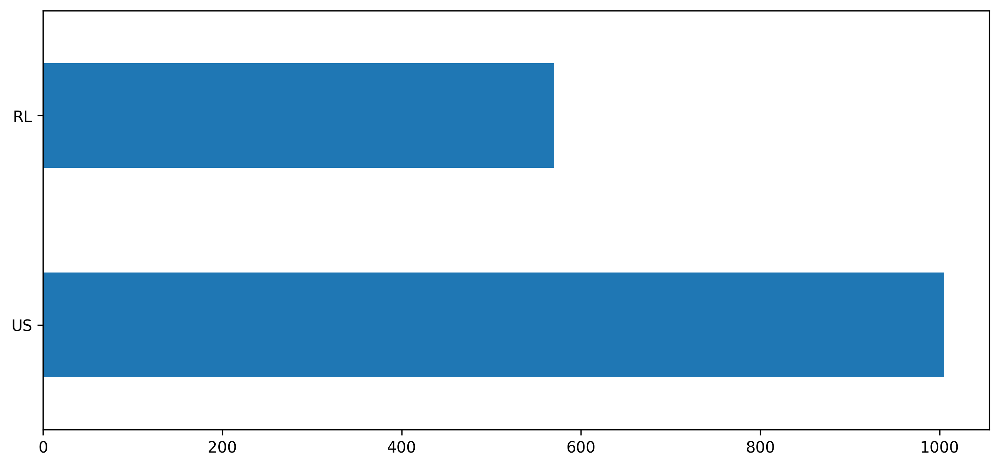

In [92]:
df["speaker"].value_counts().plot.barh()
plt.show()

## ANALYSE LENGTH OF SAMPLES

In [13]:
all_sentences = df
all_sent_length = [x.shape[0]/SAMPLING_RATE for x in all_sentences["data"]]

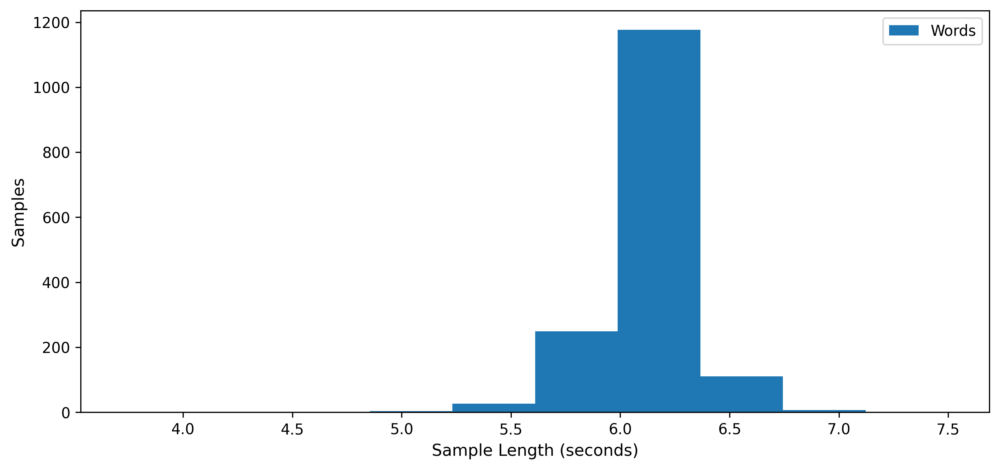

In [14]:
plt.hist(all_sent_length)
plt.xlabel("Sample Length (seconds)")
plt.ylabel("Samples")
plt.legend(["Words","Sentences"])
# save_fig("length distribution")
plt.show()

In [96]:
print("Max length of sentence utterances in seconds: %.2fs" % np.max(all_sent_length))
print("Min length of sentence utterances in seconds: %.2fs" % np.min(all_sent_length))
print("Avg length of sentence utterances in seconds: %.2fs" % np.mean(all_sent_length))

Max length of sentence utterances in seconds: 7.50s
Min length of sentence utterances in seconds: 3.72s
Avg length of sentence utterances in seconds: 6.13s


In [15]:
all_sent_RL = df.query('speaker=="RL"')
all_sent_US = df.query('speaker=="US"')

all_sent_length_RL = [x.shape[0]/SAMPLING_RATE for x in all_sent_RL["data"]]
all_sent_length_US = [x.shape[0]/SAMPLING_RATE for x in all_sent_US["data"]]


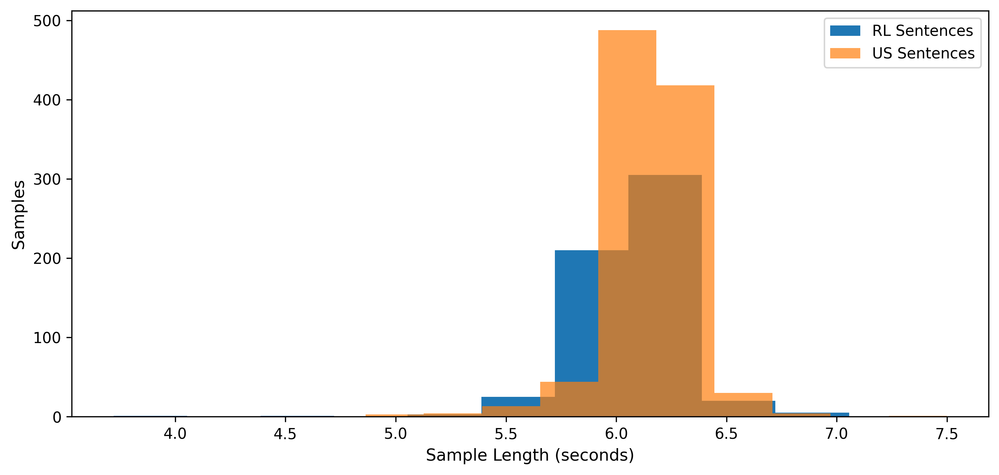

In [103]:
plt.hist(all_sent_length_RL)
plt.hist(all_sent_length_US,alpha=0.7)
plt.xlabel("Sample Length (seconds)")
plt.ylabel("Samples")
# save_fig("length distribution")
plt.legend(["RL Sentences","US Sentences"])
plt.show()

In [16]:
# SENTENCES =["अबको समय सुनाउ","एउटा सङ्गित बजाउ","आजको मौसम बताउ","बत्तिको अवस्था बदल","पङ्खाको स्तिथी बदल"]
all_sent_RL = df.query('speaker=="RL" and labels=="आजको मौसम बताउ"')
all_sent_US = df.query('speaker=="US" and labels=="आजको मौसम बताउ"')

all_sent_length_RL = [x.shape[0]/SAMPLING_RATE for x in all_sent_RL["data"]]
all_sent_length_US = [x.shape[0]/SAMPLING_RATE for x in all_sent_US["data"]]


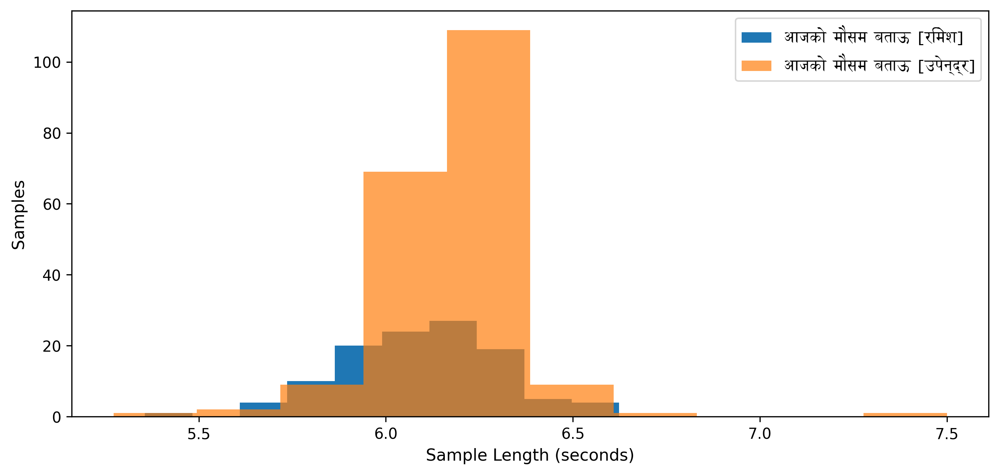

In [25]:
from matplotlib.font_manager import FontProperties
font_path = '/home/graviton/file/software/python/Kalimati.otf'    # Only for testing nepali font
fp = FontProperties(fname = font_path)

plt.hist(all_sent_length_RL)
plt.hist(all_sent_length_US,alpha=0.7)
plt.xlabel("Sample Length (seconds)")
plt.ylabel("Samples")
# save_fig("length distribution")
plt.legend(["आजको मौसम बताऊ [रिमेश]","आजको मौसम बताऊ [उपेन्द्र]"], prop = fp)
plt.show()

## SIGNAL ANALYSIS (RAW)

In [30]:
xxx = 2
sample_RL = df.query('speaker=="RL" and labels=="आजको मौसम बताउ"')["data"].iloc[xxx]
sample_US = df.query('speaker=="US" and labels=="आजको मौसम बताउ"')["data"].iloc[xxx]

def sample_sentence(index, speaker, label = "आजको मौसम बताउ"):
    return df.query('speaker=="'+speaker+'" and labels=="'+ label+'"')["data"].iloc[index]

In [31]:
print("Length of RL samples in seconds (mentally) : %.2f s" % (len(sample_RL)/SAMPLING_RATE))
print("Length of US samples in seconds (mentally) : %.2f s" % (len(sample_US)/SAMPLING_RATE))

Length of RL samples in seconds (mentally) : 6.22 s
Length of US samples in seconds (mentally) : 6.55 s


### RAW TIME SERIES PLOT -MENTALLY

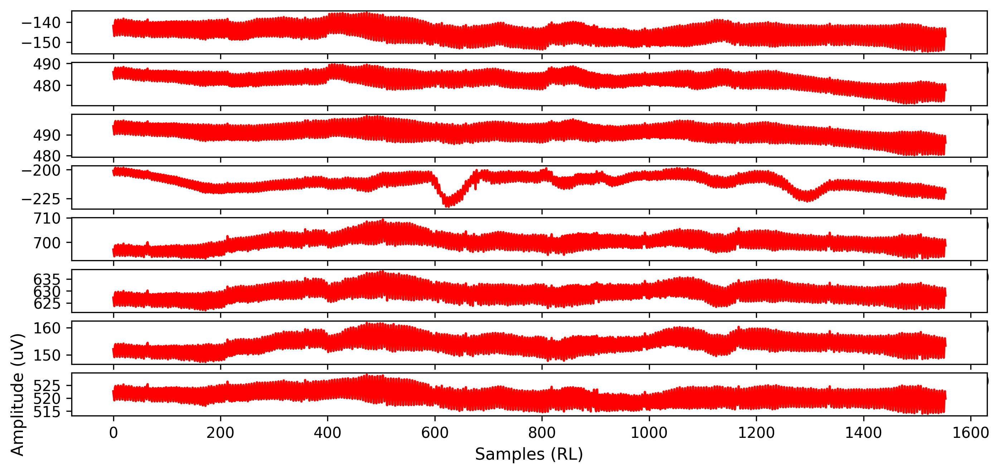

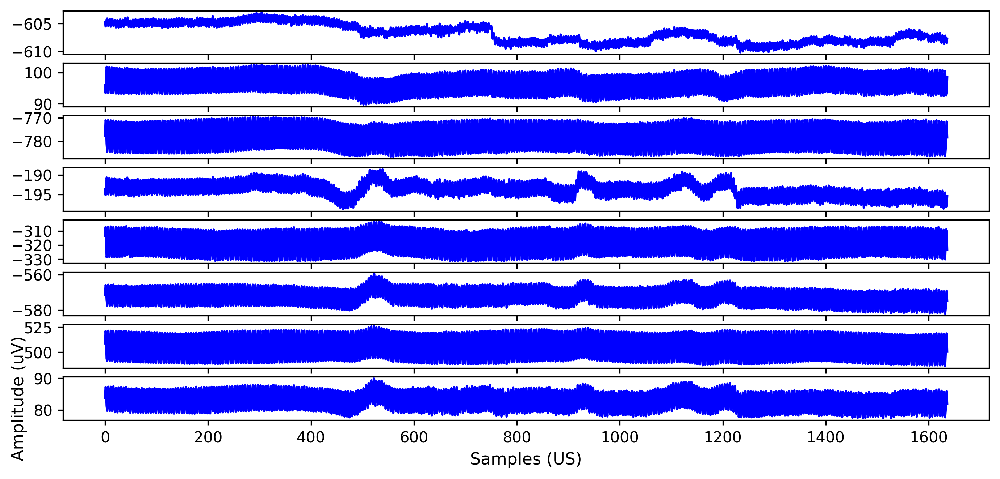

In [33]:
fig, axes = plt.subplots(nrows=8,ncols=1)
for i in range(8):
    axes[i].plot(sample_RL[:,i],"r")

plt.xlabel("Samples (RL)")
plt.ylabel("Amplitude (uV)")
plt.show()

fig, axes = plt.subplots(nrows=8,ncols=1)
for i in range(8):
    axes[i].plot(sample_US[:,i],"b")

plt.xlabel("Samples (US)")
plt.ylabel("Amplitude (uV)")
plt.show()

In [35]:
print([np.round(max(sample_RL[:,i]) - min(sample_RL[:,i]),2) for i in range(8)])
print([np.round(max(sample_US[:,i]) - min(sample_US[:,i]),2) for i in range(8)])

[19.61, 17.96, 18.75, 33.97, 15.99, 16.45, 14.51, 15.17]
[7.13, 12.67, 16.93, 10.15, 27.94, 22.27, 39.71, 12.5]


### FFT

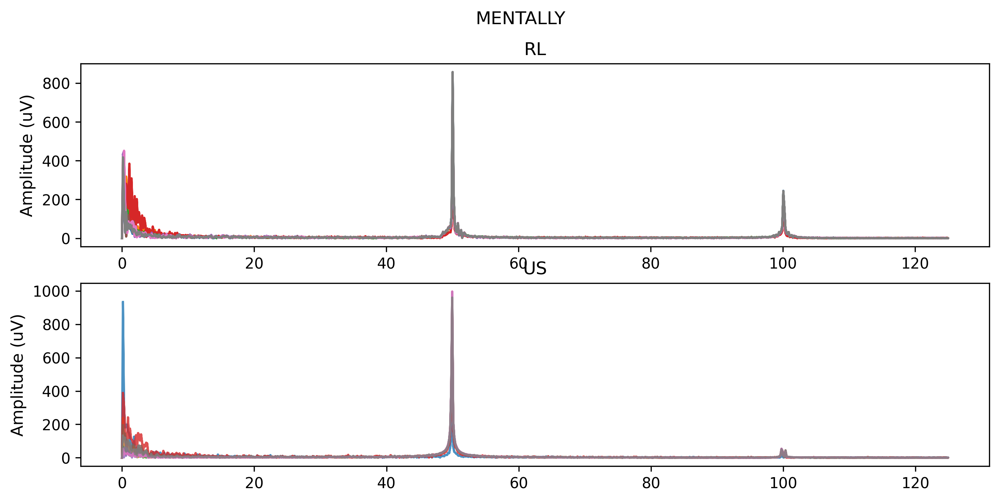

In [40]:
def FFT(data1, data2, MODE):
    plt.suptitle(MODE)
    plt.subplot(211).set_title("RL")
    N = len(data1)
    for i in range(NUM_CHANNELS):
        y = fft(zscore(data1[:,i]))
        x = fftfreq(N,1/SAMPLING_RATE)
        plt.plot(abs(x),abs(y))
    plt.ylabel("Amplitude (uV)")

    plt.subplot(212).set_title("US")
    N = len(data2)
    for i in range(NUM_CHANNELS):
        y = fft(zscore(data2[:,i]))
        x = fftfreq(N,1/SAMPLING_RATE)
        plt.plot(abs(x),abs(y),alpha=0.8)

    plt.ylabel("Amplitude (uV)")
    plt.title("US")
    plt.show()

FFT(data1=sample_RL, data2=sample_US, MODE="MENTALLY")

In [41]:
print(len(sample_RL[:,0])); print(len(sample_US[:,0]))

1554
1637


### POWER SPECTRUM

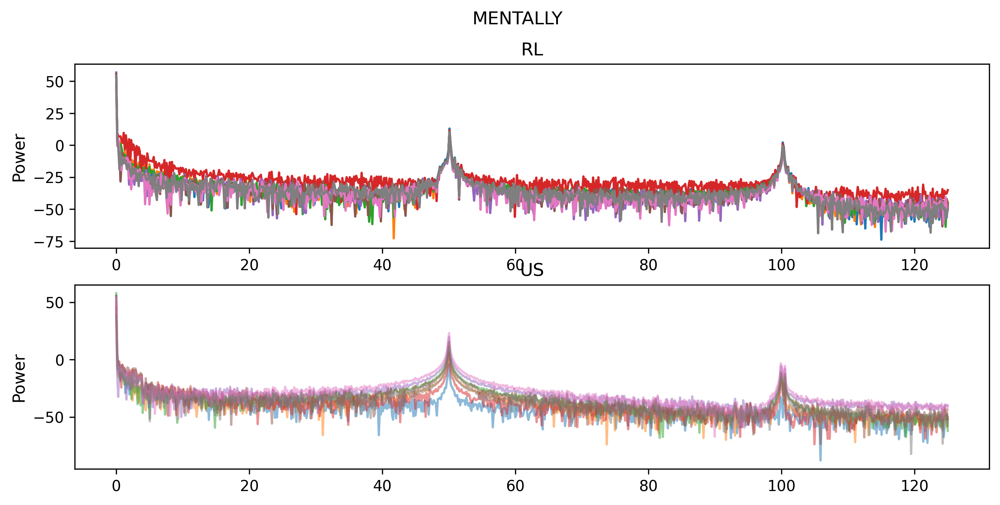

In [44]:
def power_spec(data1,data2,MODE):
    plt.suptitle(MODE)
    plt.subplot(211).set_title("RL")
    for i in range(NUM_CHANNELS):
        power = biosppy.signals.tools.power_spectrum(data1[:,i],sampling_rate=SAMPLING_RATE)
        plt.plot(power[0],power[1])
    plt.ylabel("Power")

    plt.subplot(212).set_title("US")
    for i in range(NUM_CHANNELS):
        power = biosppy.signals.tools.power_spectrum(data2[:,i],sampling_rate=SAMPLING_RATE)
        plt.plot(power[0],power[1],alpha=0.5)
    plt.ylabel("Power")
    plt.title("US")
    plt.show()

power_spec(data1=sample_RL, data2=sample_US, MODE="MENTALLY")

### STFT

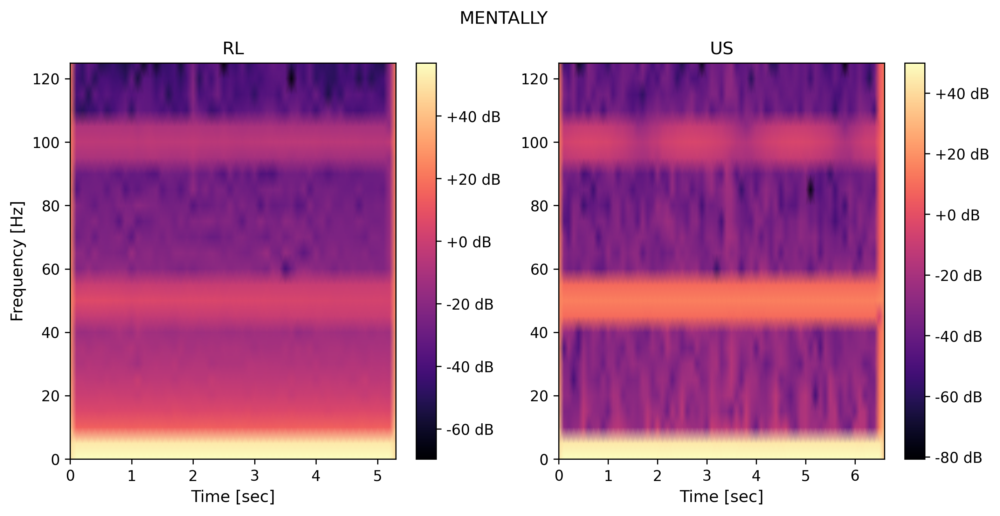

In [54]:
def STFT(data1,data2,MODE,channel=4):
    plt.suptitle(MODE)
    plt.subplot(121).set_title("RL")
    win = signal.windows.hann(50)
    f, t, Zxx = signal.stft(data1[:,channel], fs=SAMPLING_RATE, window = win, nperseg=len(win))
    plt.pcolormesh(t, f, 20*np.log10(abs(Zxx)), shading='gouraud',cmap="magma")
    plt.ylabel('Frequency [Hz]')
    plt.xlabel('Time [sec]')
#     plt.ylim([0,20])
    plt.colorbar(format='%+2.0f dB')
    
    plt.subplot(122).set_title("US")
    f, t, Zxx = signal.stft(data2[:,channel], fs=SAMPLING_RATE, nperseg=50)
    plt.pcolormesh(t, f, 20*np.log10(abs(Zxx)), shading='gouraud',cmap="magma")
    plt.xlabel('Time [sec]')
#     plt.ylim([0,20])
    plt.colorbar(format='%+2.0f dB')
    plt.show()

STFT(data1=sample_sentence(2, "RL", SENTENCES[0]),data2=sample_sentence(2, "US", SENTENCES[0]), MODE="MENTALLY")

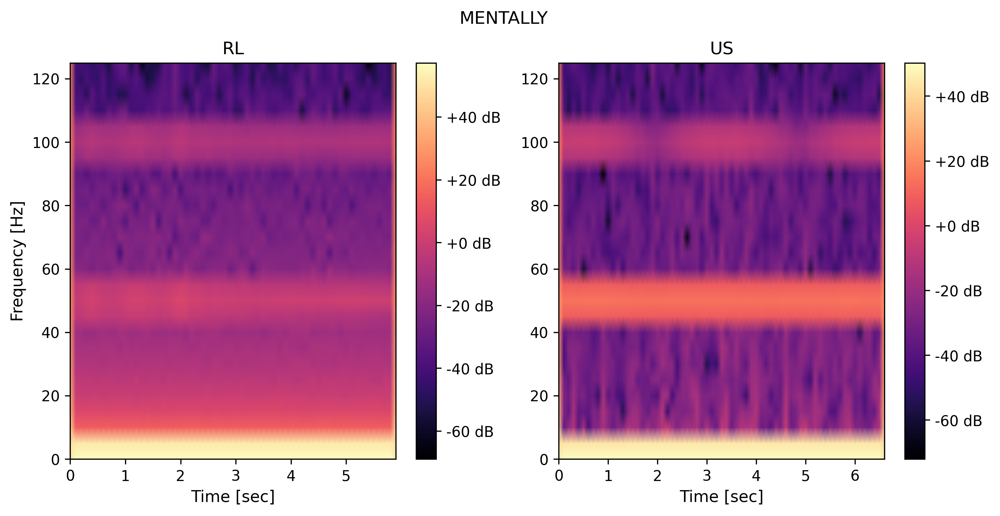

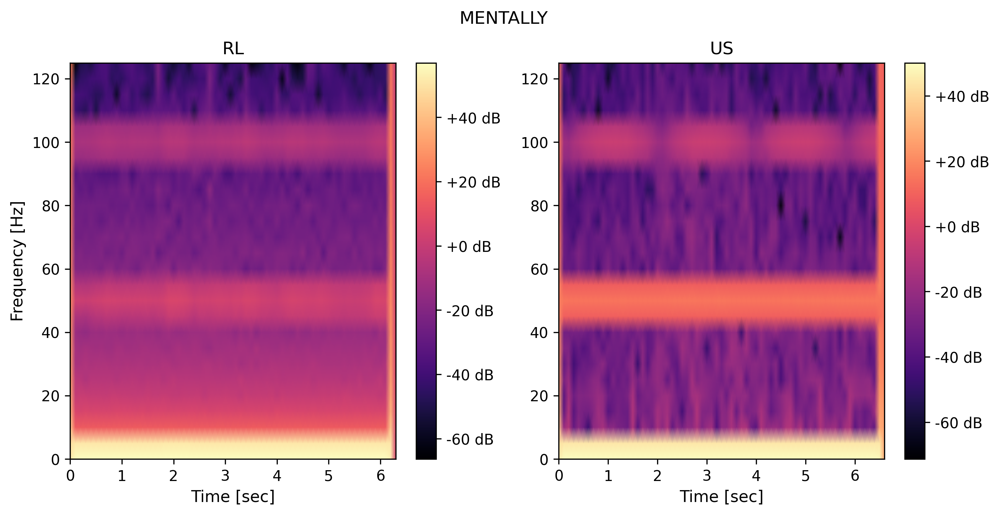

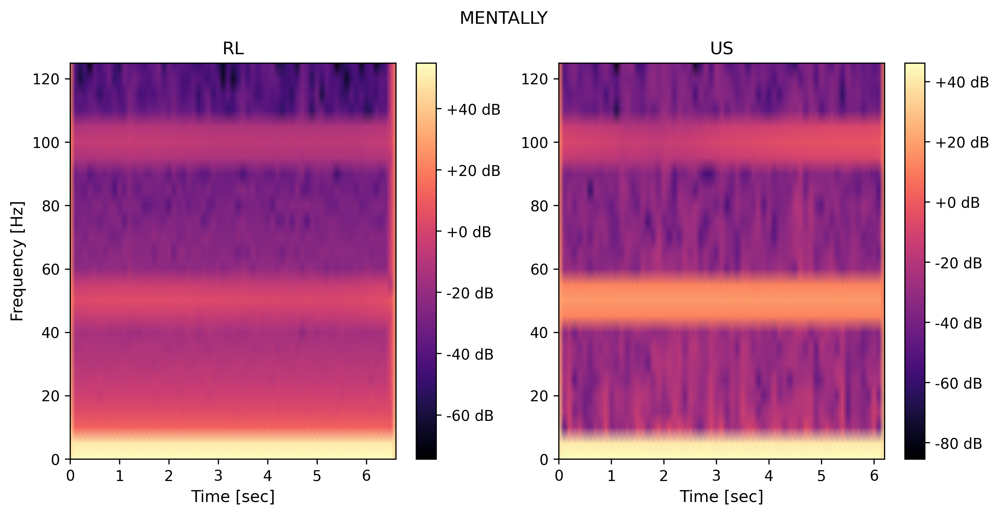

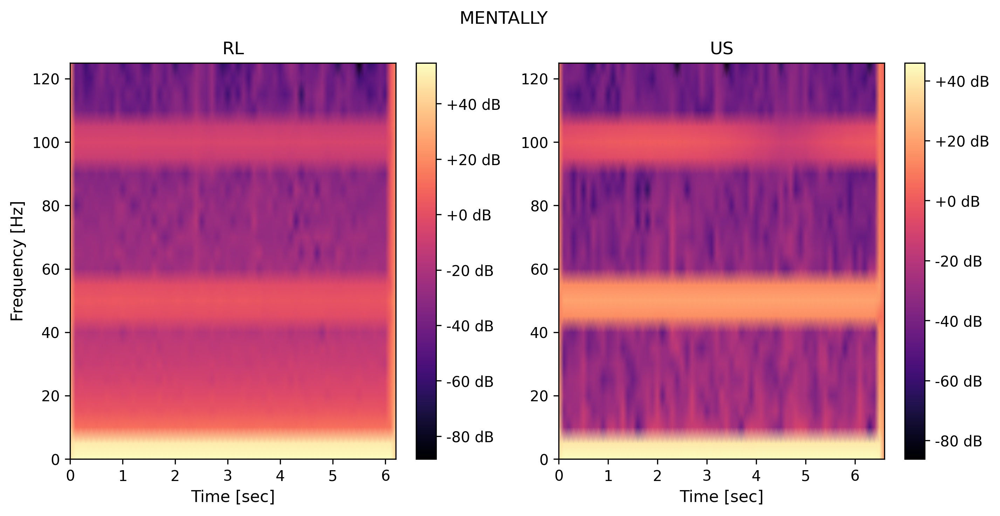

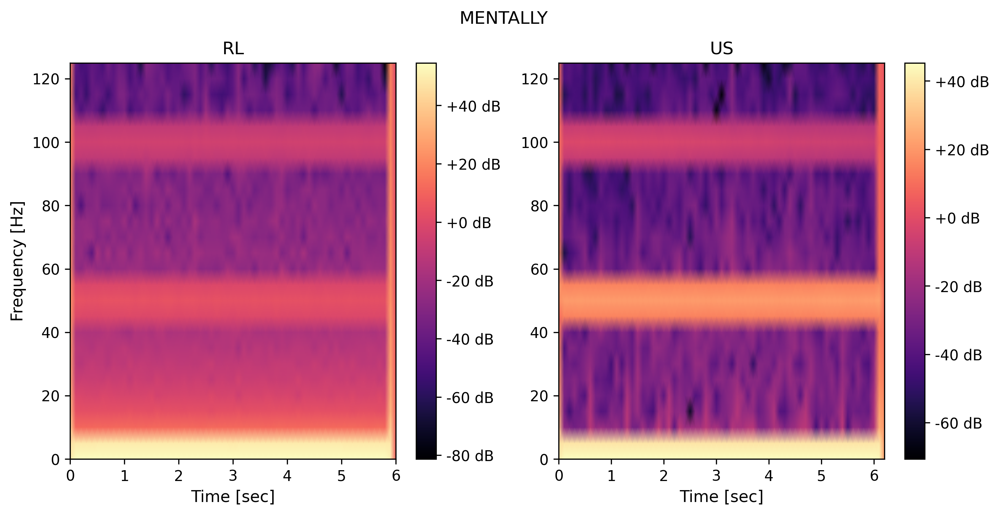

In [55]:

STFT(data1=sample_sentence(0, "RL", SENTENCES[2]), data2=sample_sentence(0, "US", SENTENCES[2]),MODE="MENTALLY")
STFT(data1=sample_sentence(2, "RL", SENTENCES[2]), data2=sample_sentence(2, "US", SENTENCES[2]),MODE="MENTALLY")
STFT(data1=sample_sentence(4, "RL", SENTENCES[2]), data2=sample_sentence(4, "US", SENTENCES[2]),MODE="MENTALLY")
STFT(data1=sample_sentence(6, "RL", SENTENCES[2]), data2=sample_sentence(6, "US", SENTENCES[2]),MODE="MENTALLY")
STFT(data1=sample_sentence(8, "RL", SENTENCES[2]), data2=sample_sentence(8, "US", SENTENCES[2]),MODE="MENTALLY")

### SPECTOGRAM

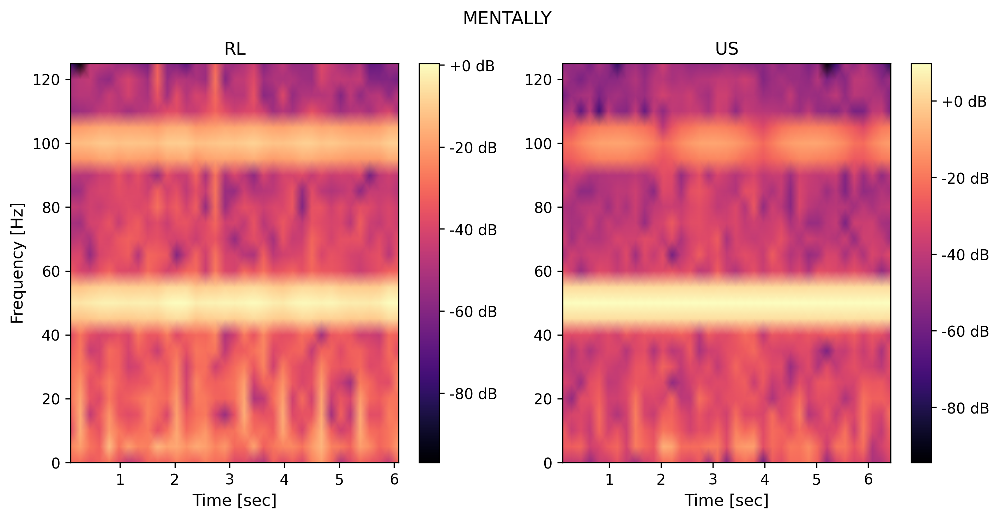

In [62]:
def SPECTOGRAM(data1,data2,MODE,channel=4):
    plt.suptitle(MODE)
    plt.subplot(121).set_title("RL")
    win = signal.windows.hamming(50)

    f, t, Sxx = signal.spectrogram(data1[:,channel], fs=SAMPLING_RATE, window = win, nperseg=len(win))
#     print(Sxx)
    plt.pcolormesh(t, f, 10*np.log10(Sxx), shading='gouraud',cmap="magma")
    plt.ylabel('Frequency [Hz]')
    plt.xlabel('Time [sec]')
#     plt.ylim([0,20])
    plt.colorbar(format='%+2.0f dB')
    
    plt.subplot(122).set_title("US")    
    f, t, Sxx = signal.spectrogram(data2[:,channel], fs=SAMPLING_RATE, window = win, nperseg=len(win))
    plt.pcolormesh(t, f, 10*np.log10(Sxx), shading='gouraud',cmap="magma")
    plt.xlabel('Time [sec]')
#     plt.ylim([0,20])
    plt.colorbar(format='%+2.0f dB')
    plt.show()

SPECTOGRAM(data1=sample_sentence(2, "RL", SENTENCES[2]),data2=sample_sentence(2, "US", SENTENCES[2]),MODE="MENTALLY")

In [ ]:
sample_sentence(2, "RL", "audible").shape
# librosa.feature.mfcc(y = np.asfortranarray(sample_sentence(1, "RL", "audible" )[:, 0]))
# np.asfortranarray(sample_sentence(1, "RL", "audible" )[:, 0]).shape
sample_sentence(1, "RL", "audible" )[:, 0].shape


## MFCC


##### Don't know if this implementation is correct ??...

In [ ]:
def MFCC(data1,data2,MODE,channel=4):
    
    #mfcc parameter
    n_mfcc = 40
    
    plt.suptitle(MODE)
    plt.subplot(121).set_title("RL")
    # Passing through arguments to the Mel filters
    S = librosa.feature.melspectrogram(y=np.asfortranarray(data1[:, channel]),n_fft = 100, sr=SAMPLING_RATE,
                                       n_mels=128, fmax=250, hop_length=5, power = 1)
    display.specshow(librosa.power_to_db(S,ref=np.max),y_axis='mel', fmax = 250, x_axis="time")
    plt.colorbar(format='%+2.0f dB')
#     plt.ylabel('Frequency [Hz]')
#     plt.xlabel('Time [sec]')
    
    plt.subplot(122).set_title("US")
    # Passing through arguments to the Mel filters
    S = librosa.feature.melspectrogram(y=np.asfortranarray(data2[:, channel]),n_fft = 100, sr=SAMPLING_RATE,
                                       n_mels=128, fmax=250, hop_length=5, power=1)
    display.specshow(librosa.power_to_db(S,ref=np.max),y_axis='mel', fmax = 250, x_axis="time")
    plt.colorbar(format='%+2.0f dB')

#     plt.ylim([0,20])    
    plt.tight_layout()
    plt.show()
    
MFCC(data1=sample_sentence(0, "RL", "audible", SENTENCES[2]), data2=sample_sentence(0, "US", "audible", SENTENCES[2]),MODE="AUDIBLE")
MFCC(data1=sample_sentence(2, "RL", "mouthed", SENTENCES[2]), data2=sample_sentence(2, "US", "mouthed", SENTENCES[2]),MODE="MOUTHED")
MFCC(data1=sample_sentence(4, "RL", "mentally", SENTENCES[2]),data2=sample_sentence(4, "US", "mentally", SENTENCES[2]),MODE="MENTALLY")

'''
source : https://dsp.stackexchange.com/questions/3321/choosing-the-length-of-a-signal-when-calculating-the-fft
'''

In [ ]:
MFCC(data1=sample_sentence(0, "RL", "mouthed", SENTENCES[2]), data2=sample_sentence(0, "US", "mouthed", SENTENCES[2]),MODE="MOUTHED")
MFCC(data1=sample_sentence(2, "RL", "mouthed", SENTENCES[2]), data2=sample_sentence(2, "US", "mouthed", SENTENCES[2]),MODE="MOUTHED")
MFCC(data1=sample_sentence(4, "RL", "mouthed", SENTENCES[0]),data2=sample_sentence(4, "US", "mouthed", SENTENCES[0]),MODE="MOUTHED")
MFCC(data1=sample_sentence(0, "RL", "mouthed", SENTENCES[1]), data2=sample_sentence(0, "US", "mouthed", SENTENCES[1]),MODE="MOUTHED")
MFCC(data1=sample_sentence(2, "RL", "mouthed", SENTENCES[3]), data2=sample_sentence(2, "US", "mouthed", SENTENCES[3]),MODE="MOUTHED")
MFCC(data1=sample_sentence(4, "RL", "mouthed", SENTENCES[4]),data2=sample_sentence(4, "US", "mouthed", SENTENCES[4]),MODE="MOUTHED")

## SIGNAL ANALYSIS (FILTERED)

In [ ]:
xxx = 1
sample_RL = df.query('speaker=="RL" and labels=="आजको मौसम बताउ"')["data"].iloc[xxx]
sample_US = df.query('speaker=="US" and labels=="आजको मौसम बताउ"')["data"].iloc[xxx]


In [64]:
class Preprocess():
    """
    something something
    """
    
    pass

In [66]:
def preprocess_data(data):
    #correct dc drift
    
    #correct dc bias
    
    #normalize data
    
    #filter data
    def digital_filter(data,HPF=0.5,LPF=10,H_ORDER=4,L_ORDER=4,SR=SAMPLING_RATE):
        # Highpass filter
        f_signal = biosppy.signals.tools.filter_signal(data,
                                                     ftype="butter",
                                                     band="highpass",
                                                     order=H_ORDER,
                                                     sampling_rate=SR,
                                                     frequency=HPF)

        b,a = signal.iirnotch(50,30,SR)
        f_signal = signal.lfilter(b,a,f_signal[0])
        # Lowpass filter
        f_signal = biosppy.signals.tools.filter_signal(f_signal,
                                                     ftype="butter",
                                                     band="lowpass",
                                                     order=L_ORDER,
                                                     sampling_rate=SR,
                                                     frequency=LPF)
        return f_signal[0]
    
    f_data = []
    for i in range(NUM_CHANNELS):
        c_data = data[:,i]- data[0,i]
        c_data = c_data - np.mean(c_data)
        c_data = digital_filter(c_data)
        f_data.append(c_data)
    
    return np.array(f_data).T

In [67]:
sample_RL = preprocess_data(sample_RL)
sample_US = preprocess_data(sample_US)

### TIME SERIES PLOT - MENTALLY

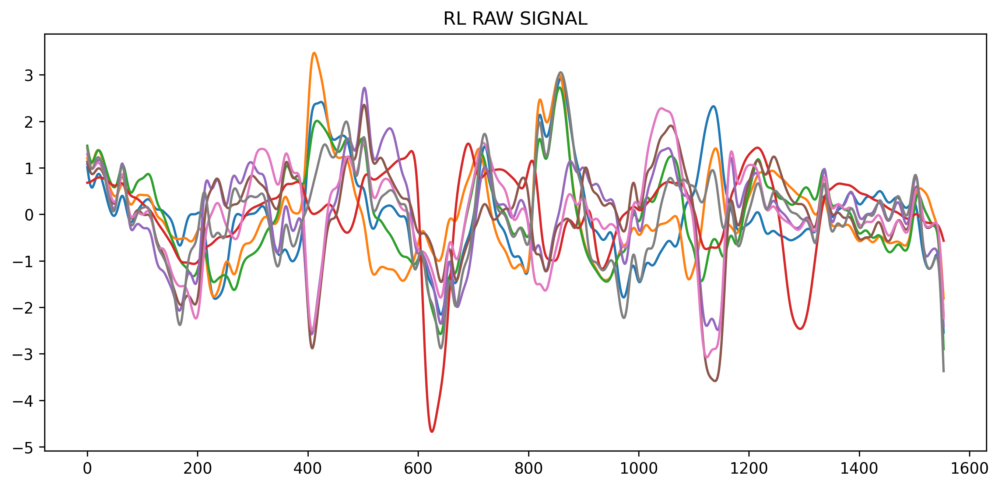

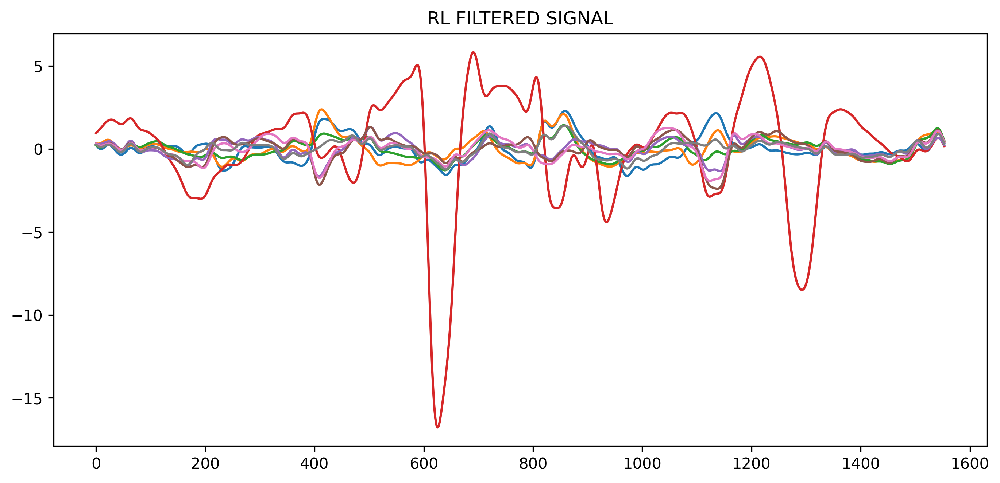

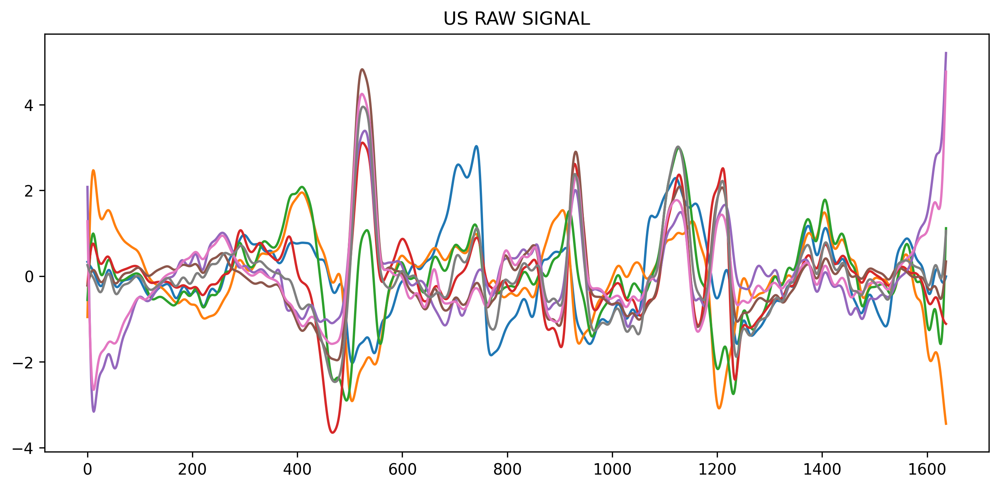

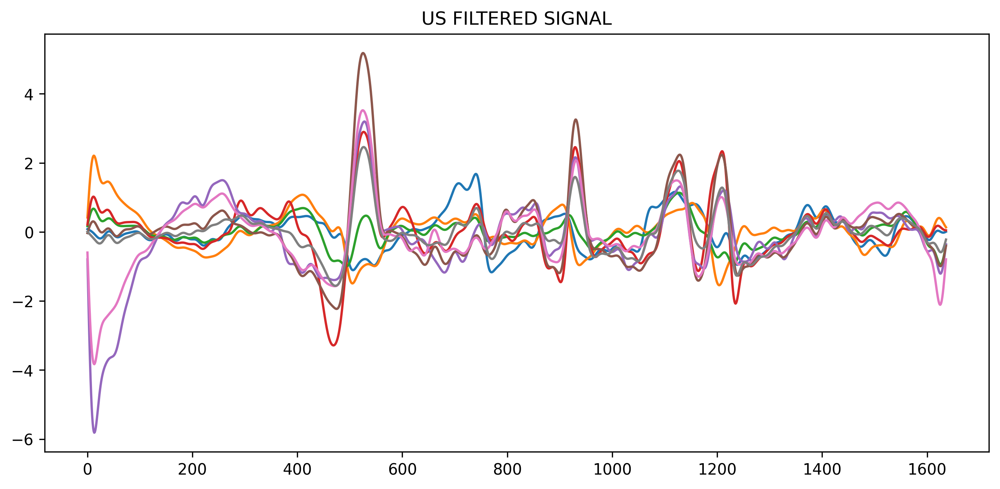

In [69]:
f_signals = preprocess_data(sample_RL)

plt.title("RL RAW SIGNAL")
plt.plot(zscore(sample_RL,axis=0))
plt.show()

plt.title("RL FILTERED SIGNAL")
plt.plot(f_signals)
plt.show()


f_signals = preprocess_data(sample_US)

plt.title("US RAW SIGNAL")
plt.plot(zscore(sample_US,axis=0))
plt.show()

plt.title("US FILTERED SIGNAL")
plt.plot(f_signals)
plt.show()

### FFT

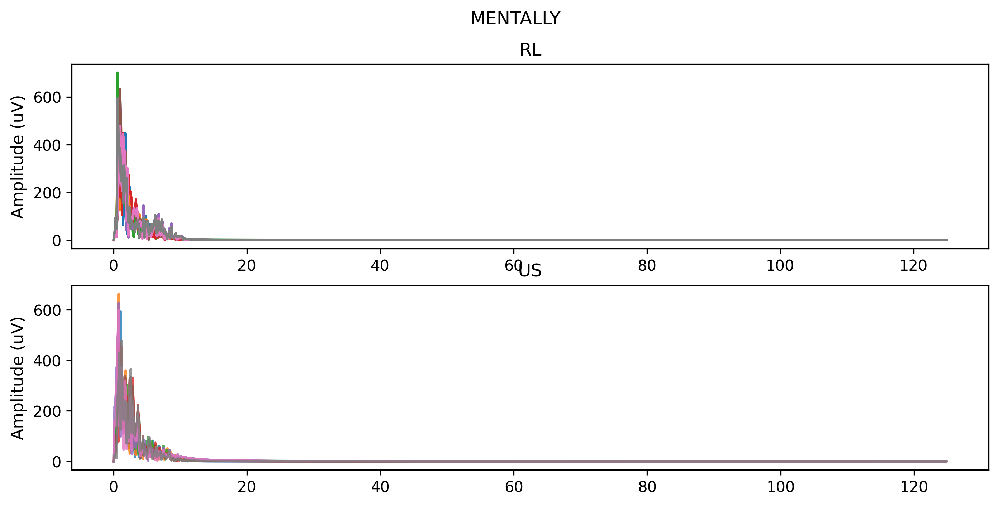

In [70]:
FFT(data1=preprocess_data(sample_RL),data2=preprocess_data(sample_US),MODE="MENTALLY")

### POWER SPECTRUM

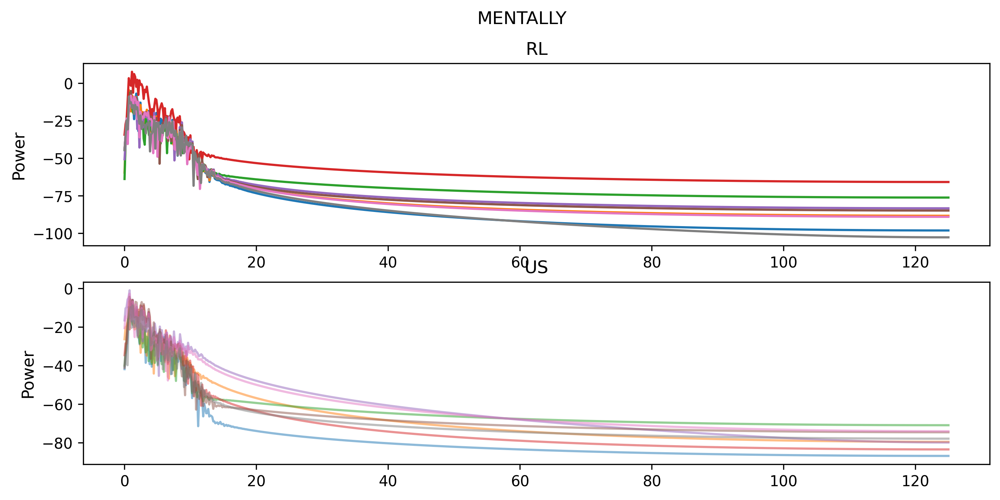

In [71]:
power_spec(data1=preprocess_data(sample_RL),data2=preprocess_data(sample_US),MODE="MENTALLY")

### STFT

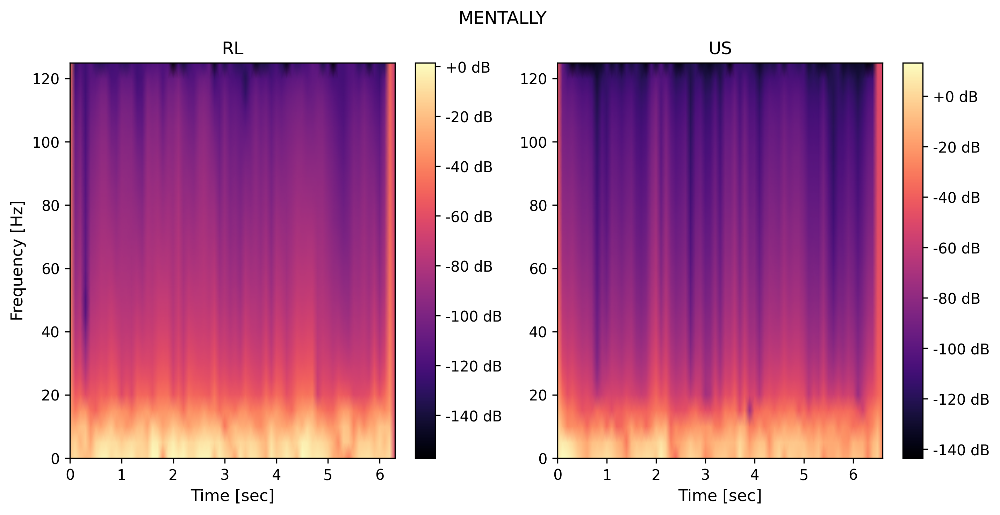

In [72]:
STFT(data1=preprocess_data(sample_RL),data2=preprocess_data(sample_US),MODE="MENTALLY")


### SPECTOGRAM

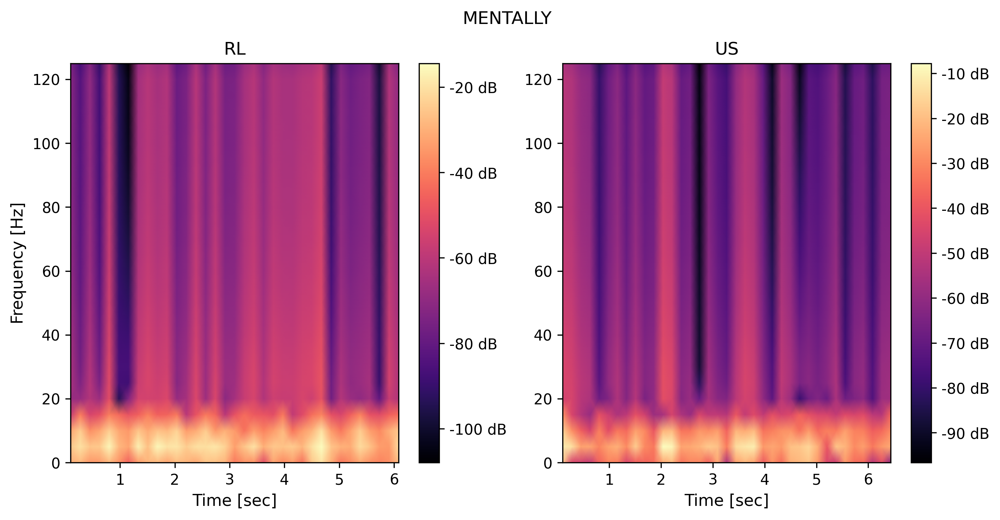

In [73]:
SPECTOGRAM(data1=preprocess_data(sample_RL),data2=preprocess_data(sample_US),MODE="MENTALLY")

## MFCC

In [ ]:
MFCC(data1=preprocess_data(sample_sentence(4, "RL", SENTENCES[0])),data2=preprocess_data(sample_sentence(4, "US", SENTENCES[0])),MODE="MENTALLY")

### MODE ANALYSIS (RIDERMAN KO SIGNAL)

In [ ]:
def read_data(file):
    f = open(file, 'r')
    contents = map(lambda x : x.strip(), f.readlines())
    #the file starts with '%' and some instruction before data and removing these data 
    frames_original = list(filter(lambda x : x and x[0] != '%', contents))[1:]
    #the data row contains channels info digital trigger and accelerometer info separated by comma
    frames_original = list(map(lambda s : list(map( lambda ss: ss.strip(), s.split(','))), frames_original))
    # (8 channels) + digital triggers
    # the digital trigger is in a[16], used to indicate the utterance
    frames = list(map(lambda a: list(map(float, a[1:9])) + [float(a[16])] , frames_original))
    frames = np.array(frames)
    indices = []
    signal = []
    
    for index,f in enumerate(frames[:,-1]):
        if(bool(f) ^ bool(frames[(index+1) if ((index+1)<len(frames)) else index,-1]) ):
            indices.append(index)
            if len(indices)>1 and len(indices)%2==0:
                temp = frames[indices[len(indices)-2]:indices[len(indices)-1],:-1]
                if len(temp)< 50:
                    continue
                signal.append(temp)   

    return np.array(signal)

In [ ]:
# order : mentally, mouthed, audible
three_modes = read_data("all_modes_test.txt")

In [ ]:
three_modes.shape

In [ ]:
sample_mental = three_modes[0]
sample_mouthed = three_modes[1]
sample_audible = three_modes[2]

In [ ]:
for i in range(NUM_CHANNELS):
    abc = sample_mouthed[:,i]-sample_mouthed[0,i]
    abc = abc - np.mean(abc)
    plt.plot(abc,alpha=0.3)
plt.show()

In [ ]:
for i in range(NUM_CHANNELS):
    abc = sample_audible[:,i]-sample_audible[0,i]
    abc = abc - np.mean(abc)
    plt.plot(abc,alpha=0.3)
plt.show()

In [ ]:
for i in range(NUM_CHANNELS):
    abc = sample_mental[:,i]-sample_mental[0,i]
    abc = abc - np.mean(abc)
    plt.plot(abc,alpha=0.3)
plt.show()

### CHANNEL ANALYSIS

In [74]:
# TODO : STD of all individual channels for filtered signal (not normalized) and see variation in signal content

df_data = pd.DataFrame(all_data["data"][0],
                       columns=["Channel 1","Channel 2","Channel 3","Channel 4",
                                "Channel 5","Channel 6","Channel 7","Channel 8"])

In [75]:
df_data.head(10)

,Channel 1,Channel 2,Channel 3,Channel 4,Channel 5,Channel 6,Channel 7,Channel 8
0,-578.406918,115.988746,-753.410949,-209.809713,-322.527072,-508.186599,510.138055,93.861436
1,-578.431933,112.465563,-752.276860,-211.184608,-314.490507,-507.684514,517.923796,95.463155
2,-579.275231,108.459766,-745.250991,-212.797819,-304.837216,-501.994031,534.407116,100.362738
3,-579.878772,107.567978,-740.323915,-213.278447,-302.320222,-497.906324,541.973574,103.099550
4,-579.399650,112.525514,-745.420375,-211.253060,-313.755082,-501.645309,526.560388,99.057780
5,-578.664225,115.816884,-753.590811,-209.992566,-322.390190,-508.224579,510.043627,93.708564
6,-578.423420,112.485045,-752.402763,-211.216585,-314.160251,-507.628547,517.772441,95.511623
7,-579.010459,108.713057,-745.170053,-212.532042,-304.211215,-501.763747,534.389130,100.728944
8,-579.631942,107.824270,-740.120654,-212.870265,-301.649757,-497.672024,542.124449,103.516222
9,-579.191324,112.641922,-745.150582,-210.868365,-313.027668,-501.278600,526.975074,99.460963


In [76]:
df_data.tail(10)

,Channel 1,Channel 2,Channel 3,Channel 4,Channel 5,Channel 6,Channel 7,Channel 8
1502,-578.502349,119.320073,-751.642367,-206.854568,-330.918362,-526.318098,503.513818,92.175789
1503,-578.381467,116.567283,-752.302355,-208.059620,-324.878698,-527.256348,507.339765,92.435574
1504,-579.095369,112.581469,-745.721600,-209.782232,-314.744300,-521.755723,523.884552,97.393612
1505,-579.486088,111.102151,-740.097167,-210.424714,-310.590608,-517.056487,533.899050,101.022714
1506,-579.043943,115.522110,-743.586309,-208.491768,-320.901376,-519.490077,521.292623,97.913203
1507,-578.424424,119.265623,-751.739807,-207.047920,-330.676051,-526.239169,503.507357,92.212755
1508,-578.395960,116.432889,-752.488765,-208.151537,-324.746793,-527.236877,507.303792,92.504026
1509,-579.061405,112.132328,-745.921979,-209.688307,-314.481994,-521.608341,523.989937,97.496530
1510,-579.459109,110.486637,-740.378921,-210.478170,-310.530166,-517.123935,533.932010,100.993236
1511,-578.955496,114.938585,-743.844664,-208.598681,-320.894871,-519.683908,521.272629,97.922185


In [77]:
df_data.describe()

,Channel 1,Channel 2,Channel 3,Channel 4,Channel 5,Channel 6,Channel 7,Channel 8
count,1512.000000,1512.000000,1512.000000,1512.000000,1512.000000,1512.000000,1512.000000,1512.000000
mean,-579.069920,113.015950,-747.258552,-211.012611,-316.448898,-514.477338,521.112929,96.713325
std,1.610060,3.265680,4.800078,2.285963,7.958040,6.998847,11.550582,3.509184
min,-582.864388,106.673689,-756.801778,-218.363861,-331.214130,-527.387228,501.690274,89.236639
25%,-579.781714,110.437053,-751.761940,-212.591856,-322.252287,-520.003010,511.056408,93.817595
50%,-578.824114,112.967157,-746.769294,-210.875601,-316.320032,-514.881252,521.436010,96.594750
75%,-577.978153,115.679486,-743.306301,-209.279007,-310.007329,-509.628450,531.487070,99.891613
max,-575.668611,120.301793,-738.620293,-205.827894,-299.500475,-497.672024,542.367742,103.764023
